In [1]:
## This notebook is a test environment for automatically indexing the drone data into grids and passes... 

## First, import general packages for running python analysis:
import os
import numpy as np
from matplotlib.pyplot import *
import h5py
import datetime
import pytz
from scipy.optimize import least_squares

## Then, import the beamcals module packages and initialize 'gbosite' class:
from beamcals import corr
from beamcals import concat
from beamcals import drone
from beamcals import bicolog
import beamcals.plotting_utils as pu
import beamcals.fitting_utils as fu
import beamcals.geometry_utils as gu
import beamcals.time_utils as tu
from beamcals.sites import site
gbosite=site.site('../beamcals/beamcals/sites/GBO_config.npz')

Initializing Correlator Class using:
 --> /hirax/GBO_Aug_2021/TONE_ACQ/20210826T182904Z_yale_drone/corr/20210826T182915Z/
 --> Arrays initialized with shape (124, 256, 1024, 16)
Assigning array values by reading in data files:
 --> Loading File: 0123/0123Initializing drone data via datcon_csv routine: FLY533.csv
 --> Skipping rows 1 to 499 to eliminate NAN values
 --> Attempting to load position data from RTK
 ----> RTK data contains 13308/13308 non-nan values
Timestamp interpolation succeeded
 --> generating llh, geocentric cartesian, local cartesian, and local spherical coordinates.
 --> generating dish and receiver line of sight coordinates.
Initializing CONCAT CLASS using:
 --> /hirax/GBO_Aug_2021/TONE_ACQ/20210826T182904Z_yale_drone/corr/20210826T182915Z/
 --> FLY533.csv
Interpolating drone coordinates for each correlator timestamp:
  --> correlator timestamp axis contains 29304 elements
  --> drone timestamp axis contains 13308 elements
Maximum Pearson_R Correlations between data

/home/tyndall/anaconda3/lib/python3.8/site-packages/beamcals/concat.py:210: RuntimeWarning: Mean of empty slice
  self.V_bg[k,:,:]=np.nanmean(self.V[t_window,:,:],axis=0)
/home/tyndall/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:3913: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


Applying a time correction of -1.32 seconds using Channel 1 fits.


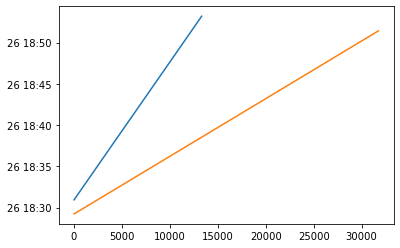

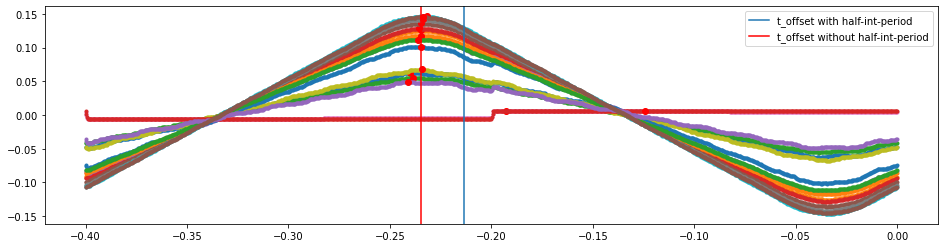

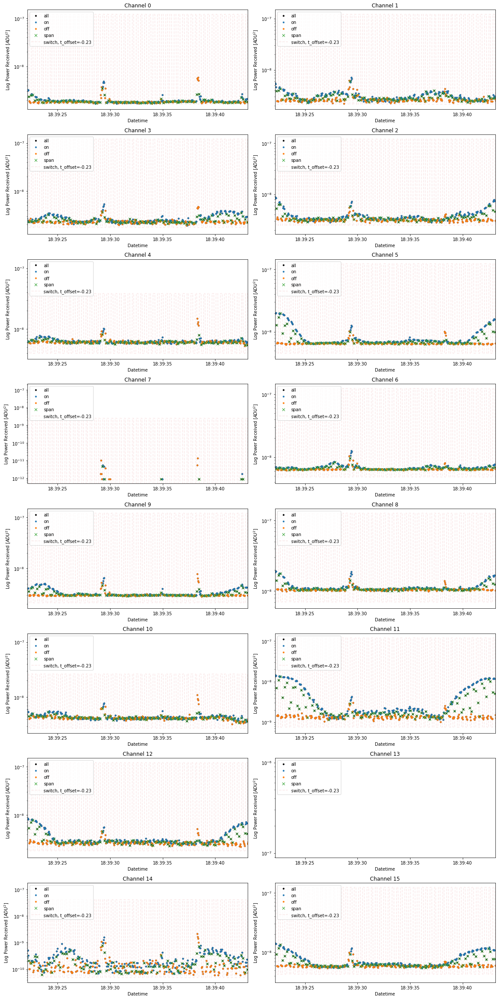

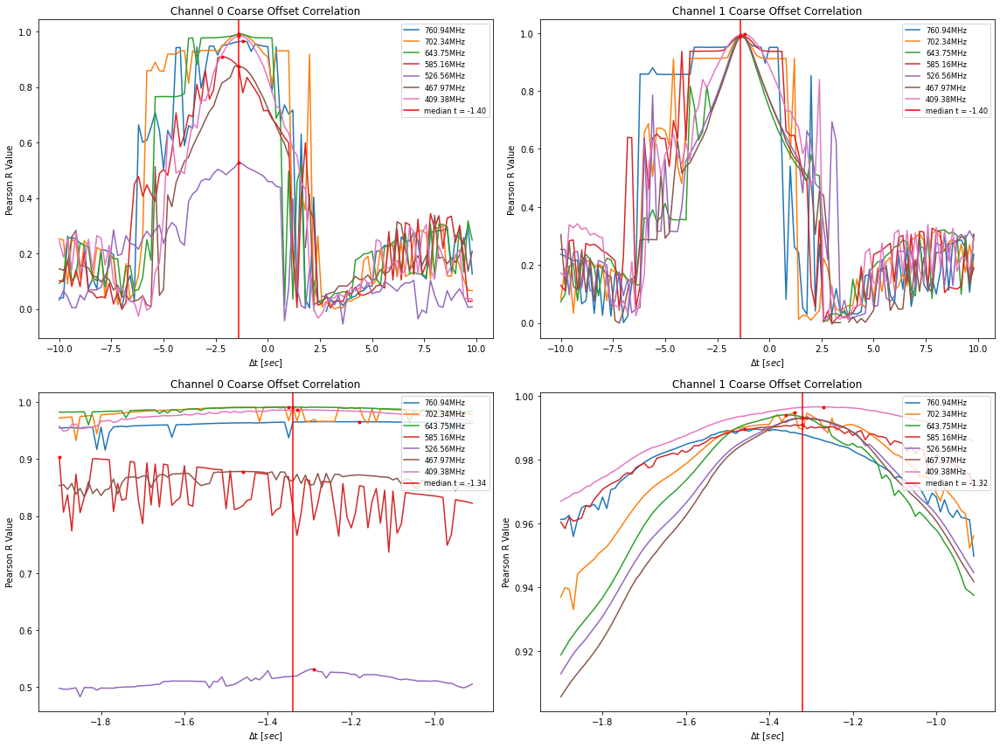

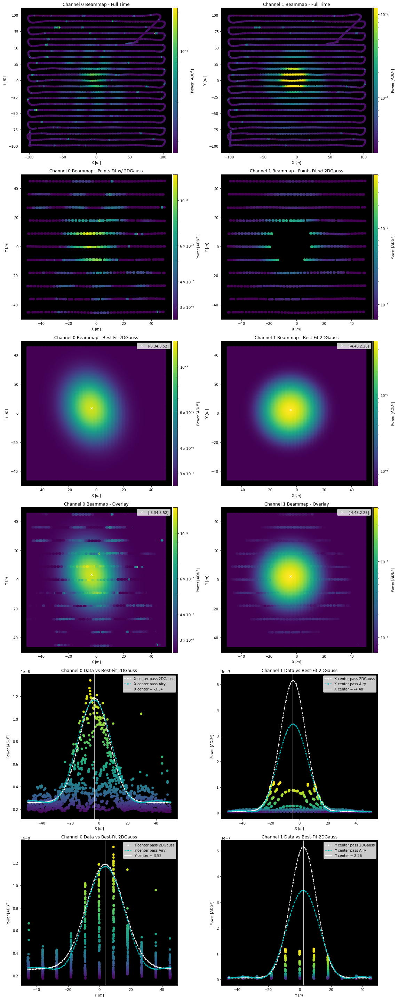

In [2]:
## 1) 0825 -- Flight from 20210826T185621: Comments only include "Large Grid 3"

## Read in the Corr_Data class:
datadir='/hirax/GBO_Aug_2021/TONE_ACQ/20210826T182904Z_yale_drone/corr/20210826T182915Z/'
gaindir='/hirax/GBO_Aug_2021/TONE_ACQ/digital_gains/20210826T182904Z_yale_drone_yale_digitalgain/'
corrtest0825=corr.Corr_Data(Data_Directory=datadir,Gain_Directory=gaindir,site_class=gbosite)

## Read in the Drone_Data class:
dronedir='/hirax/all_drone_data/datcon_csv/'
dronetest0825=drone.Drone_Data(Drone_Directory=dronedir,FLYTAG='FLY533.csv',site_class=gbosite)

## Since we know the data are from the same time we can combine them with the Concat_Class:
plot(dronetest0825.t_arr_datetime)
plot(corrtest0825.t_arr_datetime)
concattest0825=concat.CONCAT(CORRDATCLASS=corrtest0825,DRONEDATCLASS=dronetest0825)

## Use the Extract_Source_Pulses and Perform_Background_Subtraction functions:
concattest0825.Extract_Source_Pulses(Period=0.4e6,Dutycycle=0.2e6,t_bounds=[14500,15000])
concattest0825.Perform_Background_Subtraction()
concattest0825.Synchronization_Function(inputcorr=corrtest0825,inputdrone=dronetest0825)
pu.Synchronization_Verification_Plots(concattest0825,chans=np.arange(0,2),find=900)

Initializing Correlator Class using:
 --> /hirax/GBO_Aug_2021/TONE_ACQ/20210826T185621Z_yale_drone/corr/20210826T185632Z/
 --> Arrays initialized with shape (97, 256, 1024, 8)
Assigning array values by reading in data files:
 --> Loading File: 0096/0096Initializing drone data via datcon_csv routine: FLY534.csv
 --> Skipping rows 1 to 499 to eliminate NAN values
 --> Attempting to load position data from RTK
 ----> RTK data contains 12316/12316 non-nan values
Timestamp interpolation succeeded
 --> generating llh, geocentric cartesian, local cartesian, and local spherical coordinates.
 --> generating dish and receiver line of sight coordinates.
Initializing CONCAT CLASS using:
 --> /hirax/GBO_Aug_2021/TONE_ACQ/20210826T185621Z_yale_drone/corr/20210826T185632Z/
 --> FLY534.csv
Interpolating drone coordinates for each correlator timestamp:
  --> correlator timestamp axis contains 24832 elements
  --> drone timestamp axis contains 12316 elements
Maximum Pearson_R Correlations between data a

/home/tyndall/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:3913: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


Applying a time correction of -1.41 seconds using Channel 0 fits.


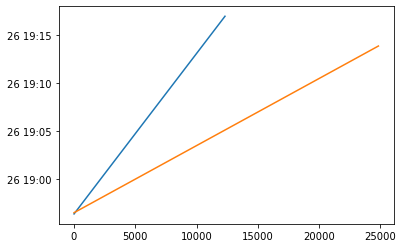

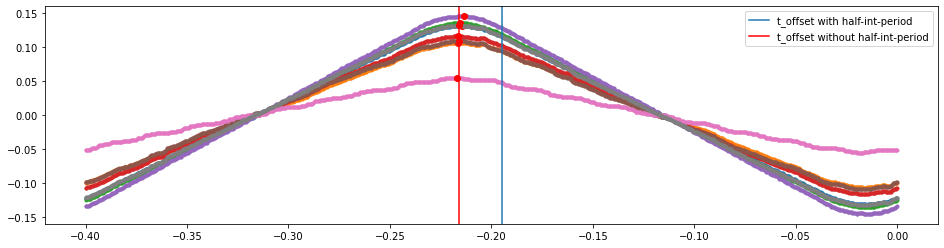

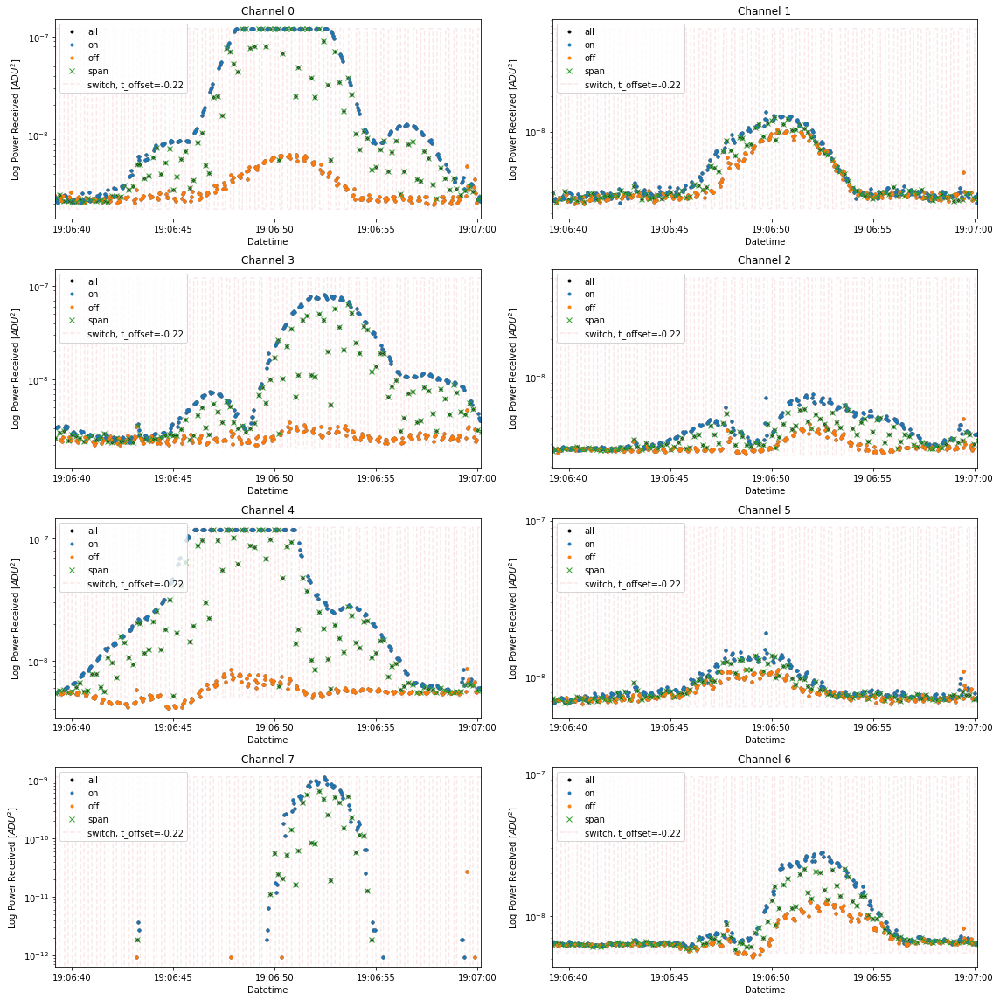

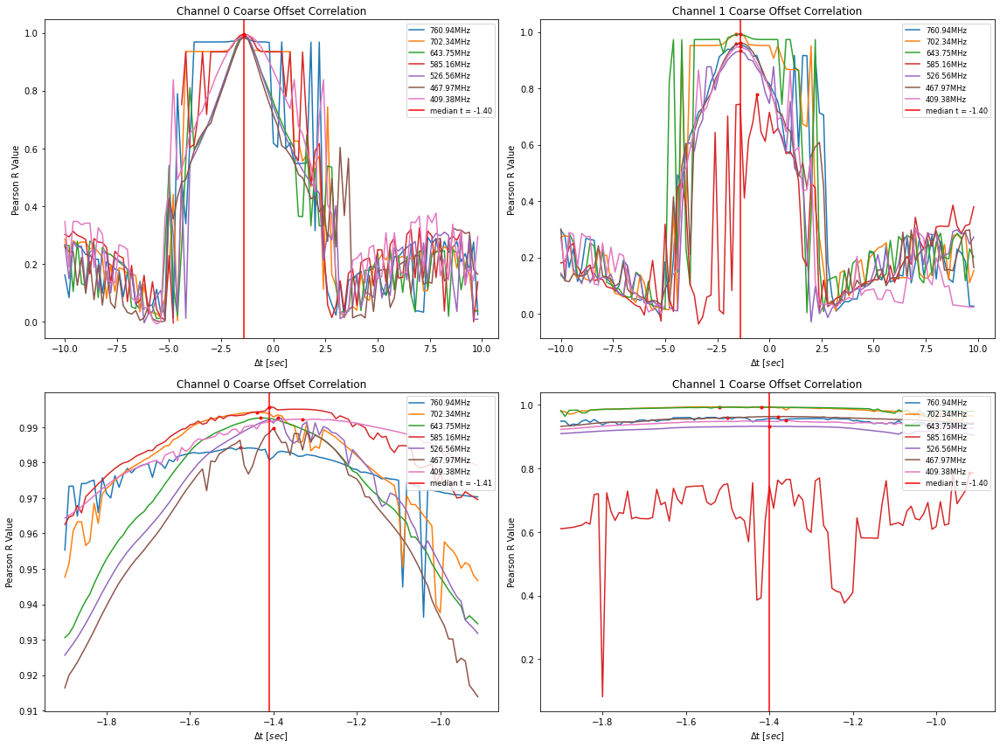

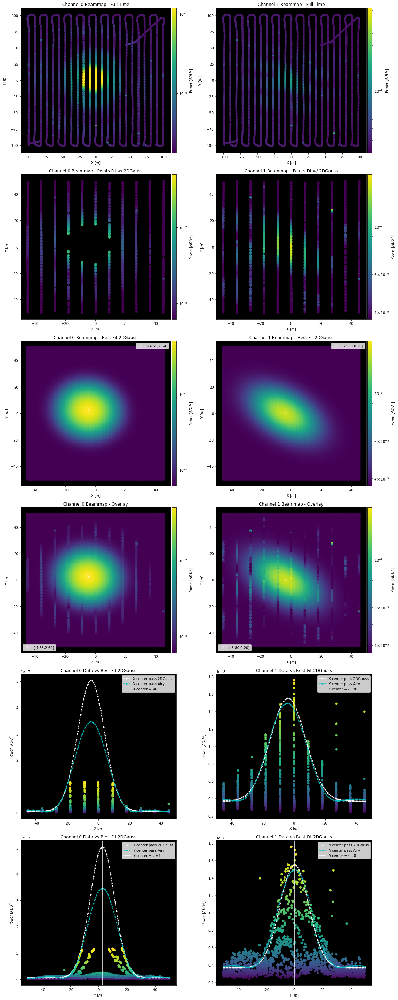

In [3]:
## 2) 0826 -- Flight from 20210826T185621: Comments only include "Large Grid 3"

## Read in the Corr_Data class:
datadir='/hirax/GBO_Aug_2021/TONE_ACQ/20210826T185621Z_yale_drone/corr/20210826T185632Z/'
gaindir='/hirax/GBO_Aug_2021/TONE_ACQ/digital_gains/20210826T185621Z_yale_drone_yale_digitalgain/'
corrtest0826=corr.Corr_Data(Data_Directory=datadir,Gain_Directory=gaindir,site_class=gbosite)

## Read in the Drone_Data class:
dronedir='/hirax/all_drone_data/datcon_csv/'
dronetest0826=drone.Drone_Data(Drone_Directory=dronedir,FLYTAG='FLY534.csv',site_class=gbosite)

## Since we know the data are from the same time we can combine them with the Concat_Class:
plot(dronetest0826.t_arr_datetime)
plot(corrtest0826.t_arr_datetime)
concattest0826=concat.CONCAT(CORRDATCLASS=corrtest0826,DRONEDATCLASS=dronetest0826)

## Use the Extract_Source_Pulses and Perform_Background_Subtraction functions:
concattest0826.Extract_Source_Pulses(Period=0.4e6,Dutycycle=0.2e6,t_bounds=[14500,15000])
concattest0826.Perform_Background_Subtraction()
concattest0826.Synchronization_Function(inputcorr=corrtest0826,inputdrone=dronetest0826)
pu.Synchronization_Verification_Plots(concattest0826,chans=np.arange(0,2),find=900)

Initializing Correlator Class using:
 --> /hirax/GBO_Oct_2021/TONE_ACQ/20211021T144905Z_yale_drone/corr/20211021T144917Z/
 --> Arrays initialized with shape (97, 256, 1024, 16)
Assigning array values by reading in data files:
 --> Loading File: 0096/0096Initializing drone data via datcon_csv routine: FLY613.csv
 --> Skipping rows 1 to 499 to eliminate NAN values
 --> Attempting to load position data from RTK
 ----> RTK data contains 0/15570 non-nan values
 ----> RTK Data not usable for this data file...
 --> Loading position data from GPS(0) instead:
Timestamp interpolation succeeded
 --> generating llh, geocentric cartesian, local cartesian, and local spherical coordinates.
 --> generating dish and receiver line of sight coordinates.
Initializing CONCAT CLASS using:
 --> /hirax/GBO_Oct_2021/TONE_ACQ/20211021T144905Z_yale_drone/corr/20211021T144917Z/
 --> FLY613.csv
Interpolating drone coordinates for each correlator timestamp:
  --> correlator timestamp axis contains 24832 elements
  

/home/tyndall/anaconda3/lib/python3.8/site-packages/beamcals/concat.py:124: RuntimeWarning: invalid value encountered in true_divide
  normminsubdata=minsubdata/np.nanmax(minsubdata)
/home/tyndall/anaconda3/lib/python3.8/site-packages/beamcals/concat.py:138: RuntimeWarning: All-NaN slice encountered
  maxPrind=np.where(Pr_arr[i,:]==np.nanmax(Pr_arr[i,:]))[0][0]
/home/tyndall/anaconda3/lib/python3.8/site-packages/beamcals/concat.py:124: RuntimeWarning: invalid value encountered in true_divide
  normminsubdata=minsubdata/np.nanmax(minsubdata)
/home/tyndall/anaconda3/lib/python3.8/site-packages/beamcals/concat.py:138: RuntimeWarning: All-NaN slice encountered
  maxPrind=np.where(Pr_arr[i,:]==np.nanmax(Pr_arr[i,:]))[0][0]
/home/tyndall/anaconda3/lib/python3.8/site-packages/beamcals/concat.py:124: RuntimeWarning: invalid value encountered in true_divide
  normminsubdata=minsubdata/np.nanmax(minsubdata)
/home/tyndall/anaconda3/lib/python3.8/site-packages/beamcals/concat.py:138: RuntimeWarnin

Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [ 95.  89.  89.  89.  nan  nan  99.  89.  89.  89. 112.  87.  89.  nan
 106.  91.]
  --> t_deltas = [-0.362 -0.364 -0.364 -0.364    nan    nan -0.36  -0.364 -0.364 -0.364
 -0.355 -0.365 -0.364    nan -0.358 -0.364]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.3433928444
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


/home/tyndall/anaconda3/lib/python3.8/site-packages/beamcals/concat.py:192: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  tight_layout()
/home/tyndall/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:3913: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


Applying a time correction of -1.37 seconds using Channel 1 fits.


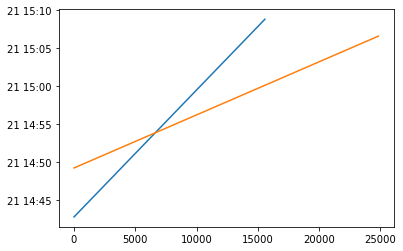

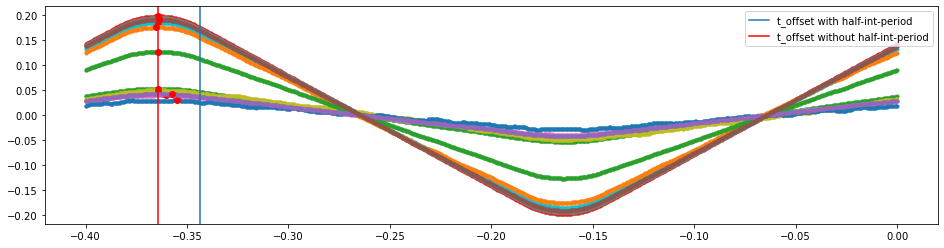

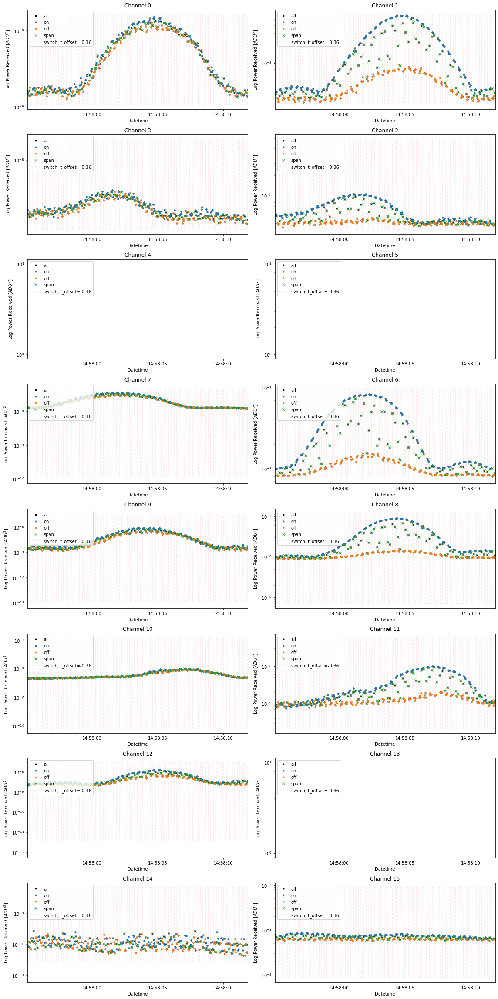

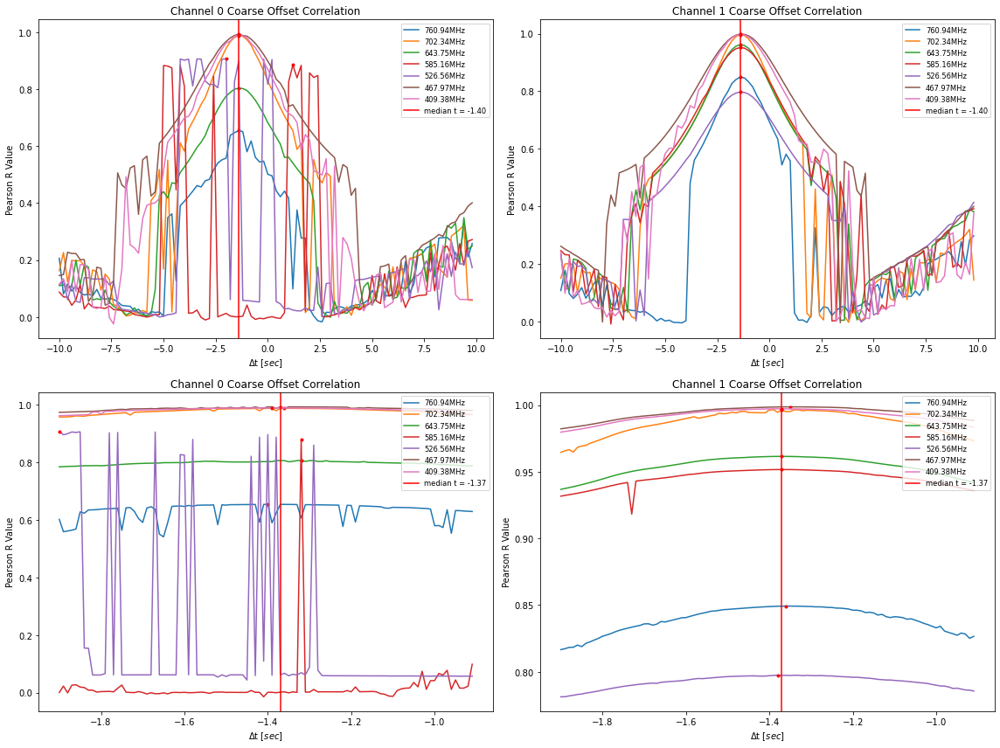

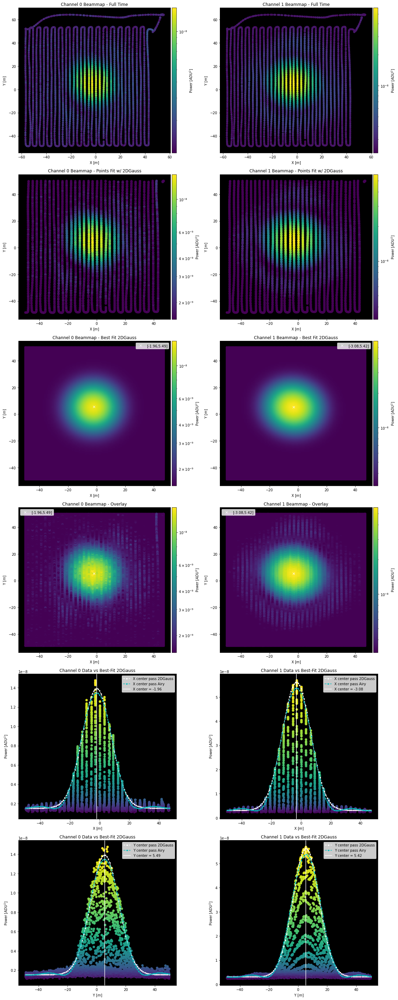

In [4]:
## 3) 1021 -- Flight from 20210826T185621: Comments only include "Large Grid 3"

## Read in the Corr_Data class:
datadir='/hirax/GBO_Oct_2021/TONE_ACQ/20211021T144905Z_yale_drone/corr/20211021T144917Z/'
gaindir='/hirax/GBO_Oct_2021/TONE_ACQ/digital_gains/20211021T144905Z_yale_drone_yale_digitalgain/'
corrtest1021=corr.Corr_Data(Data_Directory=datadir,Gain_Directory=gaindir,site_class=gbosite)

## Read in the Drone_Data class:
dronedir='/hirax/all_drone_data/datcon_csv/'
dronetest1021=drone.Drone_Data(Drone_Directory=dronedir,FLYTAG='FLY613.csv',site_class=gbosite)

## Since we know the data are from the same time we can combine them with the Concat_Class:
plot(dronetest1021.t_arr_datetime)
plot(corrtest1021.t_arr_datetime)
concattest1021=concat.CONCAT(CORRDATCLASS=corrtest1021,DRONEDATCLASS=dronetest1021)

## Use the Extract_Source_Pulses and Perform_Background_Subtraction functions:
concattest1021.Extract_Source_Pulses(Period=0.4e6,Dutycycle=0.2e6,t_bounds=[12400,12800])
concattest1021.Perform_Background_Subtraction()
concattest1021.Synchronization_Function(inputcorr=corrtest1021,inputdrone=dronetest1021)
pu.Synchronization_Verification_Plots(concattest1021,chans=np.arange(0,2),find=900)

Initializing Correlator Class using:
 --> /hirax/GBO_Oct_2021/TONE_ACQ/20211022T194308Z_yale_drone/corr/20211022T194320Z/
 --> Arrays initialized with shape (113, 256, 1024, 16)
Assigning array values by reading in data files:
 --> Loading File: 0112/0112Initializing drone data via datcon_csv routine: FLY649.csv
 --> Skipping rows 1 to 499 to eliminate NAN values
 --> Attempting to load position data from RTK
 ----> RTK Data not found for this data file...
 --> Loading position data from GPS(0) instead:
Timestamp interpolation succeeded
 --> generating llh, geocentric cartesian, local cartesian, and local spherical coordinates.
 --> generating dish and receiver line of sight coordinates.
Initializing CONCAT CLASS using:
 --> /hirax/GBO_Oct_2021/TONE_ACQ/20211022T194308Z_yale_drone/corr/20211022T194320Z/
 --> FLY649.csv
Interpolating drone coordinates for each correlator timestamp:
  --> correlator timestamp axis contains 26832 elements
  --> drone timestamp axis contains 11489 elements

/home/tyndall/anaconda3/lib/python3.8/site-packages/beamcals/concat.py:124: RuntimeWarning: invalid value encountered in true_divide
  normminsubdata=minsubdata/np.nanmax(minsubdata)
/home/tyndall/anaconda3/lib/python3.8/site-packages/beamcals/concat.py:138: RuntimeWarning: All-NaN slice encountered
  maxPrind=np.where(Pr_arr[i,:]==np.nanmax(Pr_arr[i,:]))[0][0]


Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [554. 551. 566. 566. 552. 565. 555. 554. 561. 560. 560. 561. 561.  nan
 572. 573.]
  --> t_deltas = [-0.178 -0.179 -0.173 -0.173 -0.179 -0.174 -0.178 -0.178 -0.175 -0.176
 -0.176 -0.175 -0.175    nan -0.171 -0.171]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.1544038554
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


/home/tyndall/anaconda3/lib/python3.8/site-packages/beamcals/concat.py:192: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  tight_layout()
/home/tyndall/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:3913: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


Applying a time correction of -3.45 seconds using Channel 0 fits.


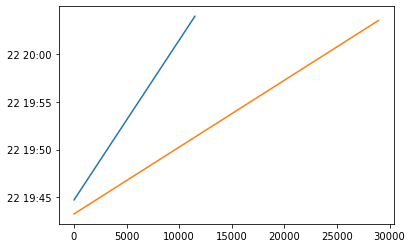

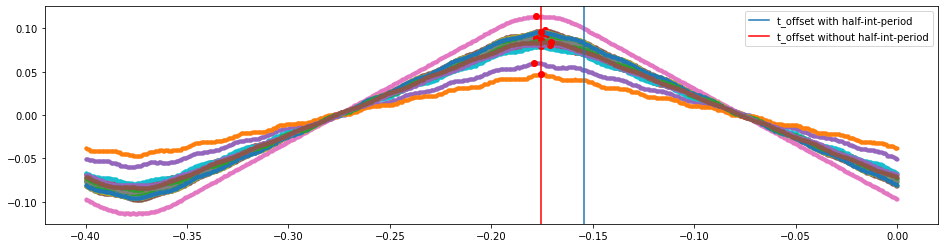

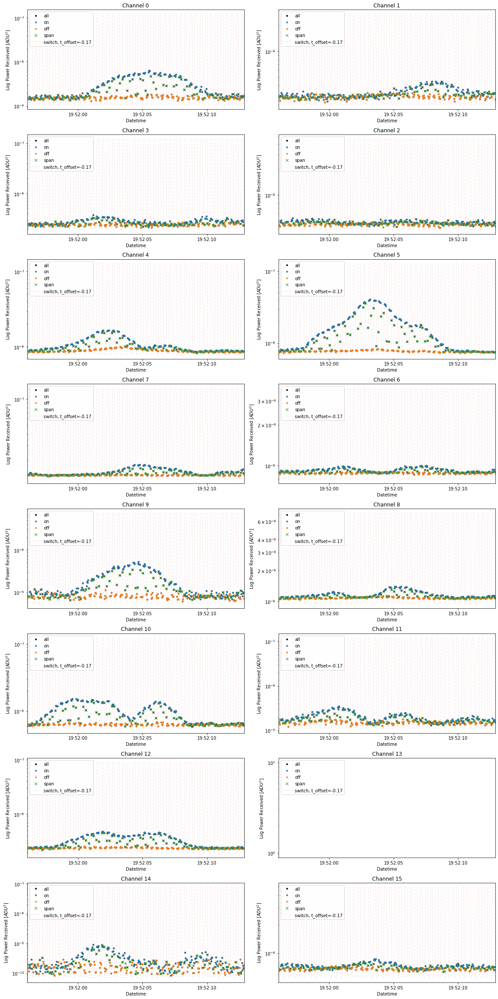

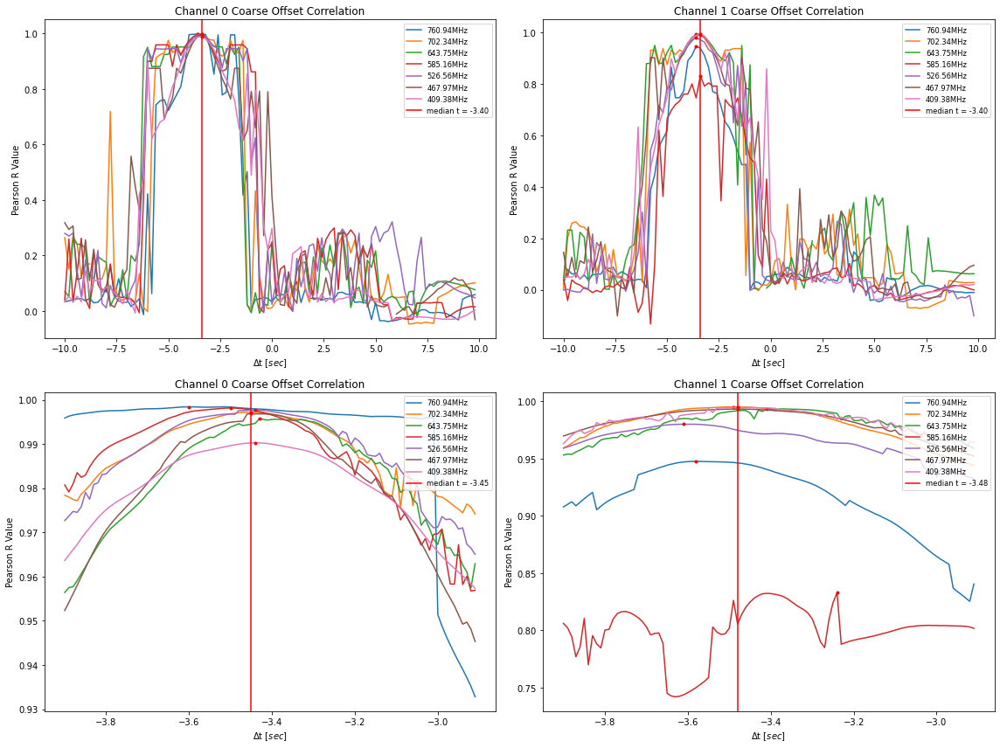

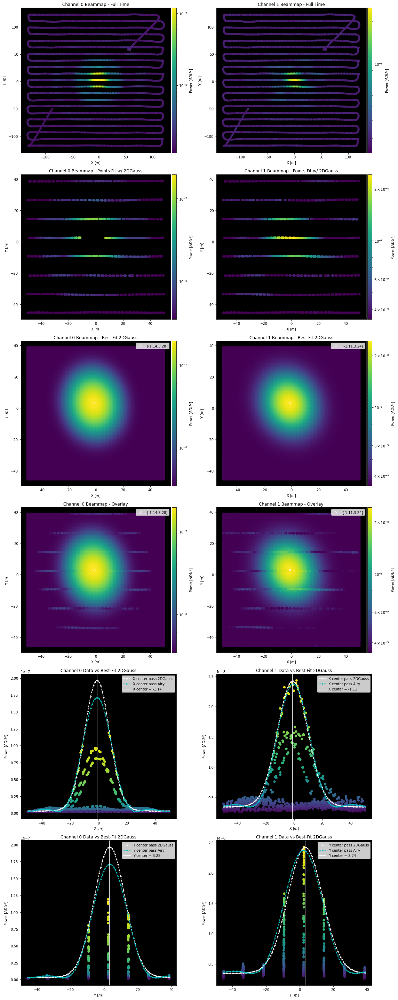

In [5]:
## Trying to examine time offsets from different flights to look for patterns/systematic issues:
## 4) 1022 -- Flight from 20211022T194308: Comments only include "Big Grid 4"

## Read in the Corr_Data class:
datadir='/hirax/GBO_Oct_2021/TONE_ACQ/20211022T194308Z_yale_drone/corr/20211022T194320Z/'
gaindir='/hirax/GBO_Oct_2021/TONE_ACQ/digital_gains/20211022T194308Z_yale_drone_yale_digitalgain/'
corrtest1022=corr.Corr_Data(Data_Directory=datadir,Gain_Directory=gaindir,site_class=gbosite)

## Read in the Drone_Data class:
dronedir='/hirax/all_drone_data/datcon_csv/'
dronetest1022=drone.Drone_Data(Drone_Directory=dronedir,FLYTAG='FLY649.csv',site_class=gbosite)

## Since we know the data are from the same time we can combine them with the Concat_Class:
plot(dronetest1022.t_arr_datetime)
plot(corrtest1022.t_arr_datetime)
concattest1022=concat.CONCAT(CORRDATCLASS=corrtest1022,DRONEDATCLASS=dronetest1022)

## Use the Extract_Source_Pulses and Perform_Background_Subtraction functions:
concattest1022.Extract_Source_Pulses(Period=0.4e6,Dutycycle=0.2e6,t_bounds=[12400,12800])
concattest1022.Perform_Background_Subtraction()
concattest1022.Synchronization_Function(inputcorr=corrtest1022,inputdrone=dronetest1022)
pu.Synchronization_Verification_Plots(concattest1022,chans=np.arange(0,2),find=900)

In [ ]:
stop
## Importing the module works, I'm satisfied with where we're at! 

In [77]:
## FUNCTIONS USED IN WRITING MODULE CODE:

## Define fitting functions:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy.optimize import least_squares
from matplotlib.colors import LogNorm
from astropy.modeling.models import AiryDisk2D
from scipy.stats import pearsonr


AD=AiryDisk2D(1,5,5,radius=1)
x=np.linspace(-60,60,1000)
y=np.linspace(-60,60,1000)
dat=np.zeros((len(x),len(y)))
for i,val in enumerate(x):
    dat[i]=AD.evaluate(val,y,10,0,0,radius=8.75)
    
imshow(dat,aspect="auto",norm=LogNorm())

def Airy_2d_LC_opt(P,x,y,V):
    amp,x0,y0,rad,c=P
    return AD.evaluate(x,y,amp,x0,y0,rad)+c-V

def Airy_2d_LC_func(P,x,y):
    amp,x0,y0,rad,c=P
    return AD.evaluate(x,y,amp,x0,y0,rad)+c

def Gauss_2d_LC_opt(P,x,y,V):
    amp,x0,xsig,y0,ysig,c=P
    return amp*np.exp(-0.5*((((x-x0)/xsig)**2.0)+(((y-y0)/ysig)**2.0)))+c-V

def Gauss_2d_LC_func(P,x,y):
    amp,x0,xsig,y0,ysig,c=P
    return amp*np.exp(-0.5*((((x-x0)/xsig)**2.0)+(((y-y0)/ysig)**2.0)))+cdef Fit_Main_Beam(inputconcat,chans,freqs,coordbounds=[50.0,50.0,150.0],ampbound=0.98):
    A_popt=np.zeros((len(chans),len(freqs),5))
    A_PR=np.zeros((len(chans),len(freqs)))
    G_popt=np.zeros((len(chans),len(freqs),6))
    G_PR=np.zeros((len(chans),len(freqs)))
    ## define timecuts for cartesian coordinates:
    txcut=inputconcat.t_index[np.abs(inputconcat.drone_xyz_LC_interp[:,0])<coordbounds[0]]
    tycut=inputconcat.t_index[np.abs(inputconcat.drone_xyz_LC_interp[:,1])<coordbounds[1]]
    tzcut=inputconcat.t_index[np.abs(inputconcat.drone_xyz_LC_interp[:,2])>coordbounds[2]]
    for i,chan in enumerate(chans):
        for j,find in enumerate(freqs):
            try:
                ## apply amplitude cut:
                tacut=inputconcat.t_index[inputconcat.V[:,find,chan]<ampbound*(np.nanmax(inputconcat.V[:,find,chan]))]
                ttcut=np.intersect1d(np.intersect1d(np.intersect1d(np.intersect1d(txcut,tycut),tzcut),tacut),inputconcat.inds_on)
                ## pull the proper coords for fitting:
                mbx=inputconcat.drone_xyz_LC_interp[ttcut,0]
                mby=inputconcat.drone_xyz_LC_interp[ttcut,1]
                mbz=inputconcat.drone_xyz_LC_interp[ttcut,2]
                mbV=inputconcat.V[ttcut,find,chan]
                mb_input_data=np.array([mbx,mby,mbV])
                ## shared params:
                amp0=np.nanmax(mbV)
                bg0=np.nanmin(mbV)
                x00=inputconcat.dish_coords[int(chan/2),0]
                y00=inputconcat.dish_coords[int(chan/2),1]
                ## airy params:
                rad0=25.0
                ## 2dgauss params:
                xsig0=6.0
                ysig0=6.0
                ## initial guess and bounds:
                pA=np.array([amp0,x00,y00,rad0,bg0])
                pG=np.array([amp0,x00,xsig0,y00,ysig0,bg0])
                ## run the fits:
                A_popt[i,j]=least_squares(Airy_2d_LC_opt,x0=pA,args=mb_input_data).x
                A_PR[i,j]=pearsonr(mbV,Airy_2d_LC_func(A_popt[i,j,:],mbx,mby))[0]
                G_popt[i,j]=least_squares(Gauss_2d_LC_opt,x0=pG,args=mb_input_data).x
                G_PR[i,j]=pearsonr(mbV,Gauss_2d_LC_func(G_popt[i,j,:],mbx,mby))[0]
            except ValueError:
                AFit_f_params[i,j,k,:]=np.NAN*np.zeros(5)
                GFit_f_params[i,j,k,:]=np.NAN*np.zeros(6)
                PRarr[i,j,k]=np.NAN
    return A_popt,A_PR,G_popt,G_PR
        
def Synchronization_Test_Function(inputdrone,inputcorr,inputconcat,coarse_params=[-10.0,10.0,0.2],fine_params=[-0.5,0.5,0.01],chans=np.arange(0,2),freqs=np.arange(100,1024,150)):
    ## Begin with specifying time axis for iteration:
    t_coarse=np.arange(coarse_params[0],coarse_params[1],coarse_params[2])
    ## Define output products from fits:
    AFit_f_params=np.zeros((len(t_coarse),len(chans),len(freqs),5))
    APRarr=np.zeros((len(t_coarse),len(chans),len(freqs)))
    GFit_f_params=np.zeros((len(t_coarse),len(chans),len(freqs),6))
    GPRarr=np.zeros((len(t_coarse),len(chans),len(freqs)))
    ## Begin iterative loop for coarse time axis:
    for i,ttry in enumerate(t_coarse):
        origtaxis=inputdrone.t_arr_datetime[:]
        tempdrone=inputdrone
        tempdrone.t_arr_datetime=inputdrone.t_arr_datetime+datetime.timedelta(seconds=ttry)
        tempconcat=concat.CONCAT(CORRDATCLASS=inputcorr,DRONEDATCLASS=tempdrone,traceback=False)
        tempconcat.inds_on=inputconcat.inds_on
        inputdrone.t_arr_datetime=origtaxis
        ## Run fits:
        result=Fit_Main_Beam(tempconcat,chans,freqs,coordbounds=[50.0,50.0,150.0],ampbound=0.999)
        AFit_f_params[i]=result[0]
        APRarr[i]=result[1]
        GFit_f_params[i]=result[2]
        GPRarr[i]=result[3]
    ## Loop over the channels and frequencies to find the index that maximizes the Pearson R Array:
    GPRmax=np.zeros((len(chans),len(freqs)))
    GPRval=np.zeros((len(chans),len(freqs)))
    for i in range(len(chans)):
        for j in range(len(freqs)):
            try:
                GPRmax[i,j]=np.where(GPRarr[:,i,j]==np.nanmax(GPRarr[:,i,j]))[0][0]
                GPRval[i,j]=GPRarr[int(GPRmax[i,j]),i,j]
            except IndexError:
                GPRmax[i,j]=np.NAN
                GPRval[i,j]=np.NAN
    copolchan=np.where(np.nanmean(GPRval,axis=1)==np.nanmax(np.nanmean(GPRval,axis=1)))[0][0]
    ## Redefine time axis for fine resolution:
    tfine0=t_coarse[int(np.nanmedian(GPRmax[copolchan,:]))]
    t_fine=np.arange(tfine0+fine_params[0],tfine0+fine_params[1],fine_params[2])
    ## Define output products from fine resolution fits:
    AFit_f_params_fine=np.zeros((len(t_fine),len(chans),len(freqs),5))
    APRarr_fine=np.zeros((len(t_fine),len(chans),len(freqs)))
    GFit_f_params_fine=np.zeros((len(t_fine),len(chans),len(freqs),6))
    GPRarr_fine=np.zeros((len(t_fine),len(chans),len(freqs)))
    ## Begin iterative loop for coarse time axis:    
    for i,ttry in enumerate(t_fine):
        origtaxis=inputdrone.t_arr_datetime[:]
        tempdrone=inputdrone
        tempdrone.t_arr_datetime=inputdrone.t_arr_datetime+datetime.timedelta(seconds=ttry)
        tempconcat=concat.CONCAT(CORRDATCLASS=inputcorr,DRONEDATCLASS=tempdrone,traceback=False)
        tempconcat.inds_on=inputconcat.inds_on
        inputdrone.t_arr_datetime=origtaxis
        ## Run fits:
        result=Fit_Main_Beam(tempconcat,chans,freqs,coordbounds=[50.0,50.0,150.0],ampbound=0.999)
        AFit_f_params_fine[i]=result[0]
        APRarr_fine[i]=result[1]
        GFit_f_params_fine[i]=result[2]
        GPRarr_fine[i]=result[3]
    ## Find the maximal Pearson R values for the fine time axis:
    GPRmax_fine=np.zeros((len(chans),len(freqs)))
    GPRval_fine=np.zeros((len(chans),len(freqs)))
    for i in range(len(chans)):
        for j in range(len(freqs)):
            try:
                GPRmax_fine[i,j]=np.where(GPRarr_fine[:,i,j]==np.nanmax(GPRarr_fine[:,i,j]))[0][0]
                GPRval_fine[i,j]=GPRarr_fine[int(GPRmax_fine[i,j]),i,j]
            except IndexError:
                GPRmax_fine[i,j]=np.NAN
                GPRval_fine[i,j]=np.NAN
    copolchan_fine=np.where(np.nanmean(GPRval_fine,axis=1)==np.nanmax(np.nanmean(GPRval_fine,axis=1)))[0][0]
    tfinex=t_fine[int(np.nanmedian(GPRmax_fine[copolchan_fine,:]))]
    fig0,[[ax1,ax2],[ax3,ax4]]=subplots(nrows=2,ncols=2,figsize=(16,12))
    for i,ax in enumerate([ax1,ax2]):
        for k,find in enumerate(freqs):
            ax.plot(t_coarse,GPRarr[:,i,k],label='{:.2f}MHz'.format(tempconcat.freq[find]))
            ax.plot(t_coarse[int(GPRmax[i,k])],GPRarr[int(GPRmax[i,k]),i,k],'r.')
        ax.axvline(t_coarse[int(np.nanmedian(GPRmax[i]))],c='r',label='median t = {:.2f}'.format(t_coarse[int(np.nanmedian(GPRmax[i]))]))
        ax.set_title('Channel {} Coarse Offset Correlation'.format(chans[i]))
        ax.set_xlabel('$\Delta$t $[sec]$')
        ax.set_ylabel('Pearson R Value')
        ax.legend(loc=1,fontsize='small')
    for i,ax in enumerate([ax3,ax4]):
        for k,find in enumerate(freqs):
            ax.plot(t_fine,GPRarr_fine[:,i,k],label='{:.2f}MHz'.format(tempconcat.freq[find]))
            ax.plot(t_fine[int(GPRmax_fine[i,k])],GPRarr_fine[int(GPRmax_fine[i,k]),i,k],'r.')
        ax.axvline(t_fine[int(np.nanmedian(GPRmax_fine[i]))],c='r',label='median t = {:.2f}'.format(t_fine[int(np.nanmedian(GPRmax_fine[i]))]))
        ax.set_title('Channel {} Coarse Offset Correlation'.format(chans[i]))
        ax.set_xlabel('$\Delta$t $[sec]$')
        ax.set_ylabel('Pearson R Value')
        ax.legend(loc=1,fontsize='small')
    tight_layout()
    ## Reassign variables:
    origtaxis=inputdrone.t_arr_datetime[:]
    tempdrone=inputdrone
    tempdrone.t_arr_datetime=inputdrone.t_arr_datetime+datetime.timedelta(seconds=tfinex)
    tempconcat=concat.CONCAT(CORRDATCLASS=inputcorr,DRONEDATCLASS=tempdrone,traceback=False)
    tempconcat.Extract_Source_Pulses(t_bounds=[8000,12000])
    tempconcat.Perform_Background_Subtraction()
    inputdrone.t_arr_datetime=origtaxis
    return tempconcat
    Synchronization_Test_Function(inputconcat=tempconcat,chans=np.arange(0,2),find=900)
    
def Synchronization_Verification_Plots(inputconcat,chans=np.arange(0,2),find=900):
    ## Produce additional verification plots:
    ## Make figures for the best-fit time offset at a particular frequency:
    figure,[[ax1,ax2],[ax3,ax4],[ax5,ax6],[ax7,ax8],[ax9,ax10],[ax11,ax12]]=subplots(nrows=6,ncols=2,figsize=(16,40))
    ## Make temp concat file with tfinex (best fit time offset)  
    ## Loop through fits and make the plot:
    for j,chan in enumerate(chans):
        ## define timecuts for amplitude:
        tacut=inputconcat.t_index[inputconcat.V[:,find,chan]<0.999*(np.nanmax(inputconcat.V[:,find,chan]))]
        ## define timecuts for cartesian coordinates:
        txcut=inputconcat.t_index[np.abs(inputconcat.drone_xyz_LC_interp[:,0])<50.0]
        tycut=inputconcat.t_index[np.abs(inputconcat.drone_xyz_LC_interp[:,1])<50.0]
        tzcut=inputconcat.t_index[np.abs(inputconcat.drone_xyz_LC_interp[:,2])>150.0]
        ttcut=np.intersect1d(np.intersect1d(np.intersect1d(np.intersect1d(txcut,tycut),tzcut),tacut),inputconcat.inds_on)
        ## data points for fit:
        mbx=inputconcat.drone_xyz_LC_interp[ttcut,0]
        mby=inputconcat.drone_xyz_LC_interp[ttcut,1]
        mbz=inputconcat.drone_xyz_LC_interp[ttcut,2]
        mbV=inputconcat.V[ttcut,find,j]
        mb_input_data=np.array([mbx,mby,mbV])
        ## shared params:
        amp0=np.nanmax(mbV)
        bg0=np.nanmin(mbV)
        x00=inputconcat.dish_coords[int(j/2),0]
        y00=inputconcat.dish_coords[int(j/2),1]
        ## airy params:
        rad0=25.0
        ## 2dgauss params:
        xsig0=6.0
        ysig0=6.0
        ## initial guess and bounds:
        pA=np.array([amp0,x00,y00,rad0,bg0])
        pG=np.array([amp0,x00,xsig0,y00,ysig0,bg0])
        ## run the fits:
        Apopt=least_squares(Airy_2d_LC_opt,x0=pA,args=mb_input_data).x
        Gpopt=least_squares(Gauss_2d_LC_opt,x0=pG,args=mb_input_data).x
        ## simulate space of these coords:
        simx=np.outer(np.linspace(np.nanmin(mbx),np.nanmax(mbx),100),np.ones(100)).flatten()
        simy=np.outer(np.ones(100),np.linspace(np.nanmin(mby),np.nanmax(mby),100)).flatten()
        simV=Gauss_2d_LC_func(Gpopt,simx,simy)
        ## PLOT 1
        ax=[ax1,ax2][j]
        ax.set_title('Channel {} Beammap - Full Time'.format(j))
        ax.set_facecolor('k')
        tbig=np.intersect1d(tzcut,inputconcat.inds_on)
        im=ax.scatter(inputconcat.drone_xyz_LC_interp[tbig,0],inputconcat.drone_xyz_LC_interp[tbig,1],c=inputconcat.V[tbig,find,j],s=20,norm=LogNorm())
        #im.set_clim(np.nanmin(mbV),np.nanmax(mbV))
        divider=make_axes_locatable(ax)
        cax=divider.append_axes("right", size="3%", pad=0.05)
        cbar=figure.colorbar(im,cax=cax)
        cbar.set_label('Power [$ADU^2$]')
        ## PLOT 1
        ax=[ax3,ax4][j]
        ax.set_title('Channel {} Beammap - Points Fit w/ 2DGauss'.format(j))
        ax.set_facecolor('k')
        im=ax.scatter(mbx,mby,c=mbV,norm=LogNorm())
        im.set_clim(np.nanmax((np.nanmin(simV),np.nanmin(mbV))),np.nanmax((np.nanmax(simV),np.nanmax(mbV))))
        divider=make_axes_locatable(ax)
        cax=divider.append_axes("right", size="3%", pad=0.05)
        cbar=figure.colorbar(im,cax=cax)
        cbar.set_label('Power [$ADU^2$]')
        ## PLOT 2
        ax=[ax5,ax6][j]
        ax.set_title('Channel {} Beammap - Best Fit 2DGauss'.format(j))
        ax.set_facecolor('k')
        im=ax.scatter(simx,simy,c=simV,norm=LogNorm())
        im.set_clim(np.nanmax((np.nanmin(simV),np.nanmin(mbV))),np.nanmax((np.nanmax(simV),np.nanmax(mbV))))
        divider=make_axes_locatable(ax)
        cax=divider.append_axes("right", size="3%", pad=0.05)
        cbar=figure.colorbar(im,cax=cax)
        cbar.set_label('Power [$ADU^2$]')
        ax.plot(Gpopt[1],Gpopt[3],'wx',label='[{:.2f},{:.2f}]'.format(Gpopt[1],Gpopt[3]))
        ax.legend()
        ## PLOT 3
        ax=[ax7,ax8][j]
        ax.set_title('Channel {} Beammap - Overlay'.format(j))
        ax.set_facecolor('k')
        im=ax.scatter(simx,simy,c=simV,norm=LogNorm())
        im.set_clim(np.nanmax((np.nanmin(simV),np.nanmin(mbV))),np.nanmax((np.nanmax(simV),np.nanmax(mbV))))
        im=ax.scatter(mbx,mby,c=mbV,norm=LogNorm())
        im.set_clim(np.nanmax((np.nanmin(simV),np.nanmin(mbV))),np.nanmax((np.nanmax(simV),np.nanmax(mbV))))
        divider=make_axes_locatable(ax)
        cax=divider.append_axes("right", size="3%", pad=0.05)
        cbar=figure.colorbar(im,cax=cax)
        cbar.set_label('Power [$ADU^2$]')
        ax.plot(Gpopt[1],Gpopt[3],'wx',label='[{:.2f},{:.2f}]'.format(Gpopt[1],Gpopt[3]))
        ax.legend()
        ## PLOT 4
        ax=[ax9,ax10][j]
        ax.set_title('Channel {} Data vs Best-Fit 2DGauss'.format(j))
        ax.set_facecolor('k')
        ax.scatter(mbx,mbV,c=mbV,norm=LogNorm())
        ax.plot(np.linspace(np.nanmin(mbx),np.nanmax(mbx),100),Gauss_2d_LC_func(Gpopt,np.linspace(np.nanmin(mbx),np.nanmax(mbx),100),Gpopt[3]*np.ones(100)),'w.--',label='X center pass 2DGauss')
        ax.plot(np.linspace(np.nanmin(mbx),np.nanmax(mbx),100),Airy_2d_LC_func(Apopt,np.linspace(np.nanmin(mbx),np.nanmax(mbx),100),Apopt[2]*np.ones(100)),'c.--',label='X center pass Airy')
        ax.axvline(Gpopt[1],c='w',label='X center = {:.2f}'.format(Gpopt[1]))
        ax.semilogy
        ax.legend()
        ## PLOT 4
        ax=[ax11,ax12][j]
        ax.set_title('Channel {} Data vs Best-Fit 2DGauss'.format(j))
        ax.set_facecolor('k')
        ax.scatter(mby,mbV,c=mbV,norm=LogNorm())
        ax.plot(np.linspace(np.nanmin(mby),np.nanmax(mby),100),Gauss_2d_LC_func(Gpopt,Gpopt[1]*np.ones(100),np.linspace(np.nanmin(mby),np.nanmax(mby),100)),'w.--',label='Y center pass 2DGauss')
        ax.plot(np.linspace(np.nanmin(mby),np.nanmax(mby),100),Airy_2d_LC_func(Apopt,Apopt[1]*np.ones(100),np.linspace(np.nanmin(mby),np.nanmax(mby),100)),'c.--',label='Y center pass Airy')
        ax.axvline(Gpopt[3],c='w',label='Y center = {:.2f}'.format(Gpopt[3]))
        ax.semilogy
        ax.legend()
    for i,ax in enumerate([ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8]):
        ax.set_xlabel('X $[m]$')
        ax.set_ylabel('Y $[m]$')
    for i,ax in enumerate([ax9,ax10]):
        ax.set_xlabel('X $[m]$')
        ax.set_ylabel('Power [$ADU^2$]')
    for i,ax in enumerate([ax11,ax12]):
        ax.set_xlabel('Y $[m]$')
        ax.set_ylabel('Power [$ADU^2$]')
    tight_layout()
                      
## 1) 0825 -- Flight from 20210826T185621: Comments only include "Large Grid 3"

## Read in the Corr_Data class:
datadir='/hirax/GBO_Aug_2021/TONE_ACQ/20210826T182904Z_yale_drone/corr/20210826T182915Z/'
gaindir='/hirax/GBO_Aug_2021/TONE_ACQ/digital_gains/20210826T182904Z_yale_drone_yale_digitalgain/'
corrtest0825=corr.Corr_Data(Data_Directory=datadir,Gain_Directory=gaindir,site_class=gbosite)

## Read in the Drone_Data class:
dronedir='/hirax/all_drone_data/datcon_csv/'
dronetest0825=drone.Drone_Data(Drone_Directory=dronedir,FLYTAG='FLY533.csv',site_class=gbosite)

## Since we know the data are from the same time we can combine them with the Concat_Class:
plot(dronetest0825.t_arr_datetime)
plot(corrtest0825.t_arr_datetime)
concattest0825=concat.CONCAT(CORRDATCLASS=corrtest0825,DRONEDATCLASS=dronetest0825)

## Use the Extract_Source_Pulses and Perform_Background_Subtraction functions:
concattest0825.Extract_Source_Pulses(Period=0.4e6,Dutycycle=0.2e6,t_bounds=[14500,15000])
concattest0825.Perform_Background_Subtraction()

## USING THE FUNCTIONS DEFINED IN THIS WINDOW
concatsynch0825=Synchronization_Test_Function(inputdrone=dronetest0825,inputcorr=corrtest0825,inputconcat=concattest0825,coarse_params=[-10.0,10.0,0.2],fine_params=[-0.5,0.5,0.01],chans=np.arange(0,2),freqs=np.arange(100,1024,100))
Synchronization_Verification_Plots(inputconcat=concatsynch0825,chans=np.arange(0,2),find=900)


In [ ]:
## Generalized 2dGaussian (with ellipticity test)...
from matplotlib import colors
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm
from matplotlib.ticker import MultipleLocator

def Gauss_2d_LC_func(P,x,y):
    amp,x0,xsig,y0,ysig,c=P
    return amp*np.exp(-0.5*((((x-x0)/xsig)**2.0)+(((y-y0)/ysig)**2.0)))+c

def Gauss_2d_LC_func_gen(P,x,y):
    amp,x0,xsig,y0,ysig,theta,c=P
    A=(0.5*(((np.cos(theta)/xsig)**2.0)+((np.sin(theta)/ysig)**2.0)))
    B=(0.25*((np.sin(2.0*theta)/(ysig**2.0))-(np.sin(2.0*theta)/(xsig**2.0))))
    C=(0.5*(((np.sin(theta)/xsig)**2.0)+((np.cos(theta)/ysig)**2.0)))
    return amp*np.exp(-1.0*((A*((x-x0)**2.0))+(2.0*B*(x-x0)*(y-y0))+(C*((y-y0)**2.0))))+c

def Gauss_2d_LC_opt_gen(P,x,y,V):
    amp,x0,xsig,y0,ysig,theta,c=P
    A=(0.5*(((np.cos(theta)/xsig)**2.0)+((np.sin(theta)/ysig)**2.0)))
    B=(0.25*((np.sin(2.0*theta)/(ysig**2.0))-(np.sin(2.0*theta)/(xsig**2.0))))
    C=(0.5*(((np.sin(theta)/xsig)**2.0)+((np.cos(theta)/ysig)**2.0)))
    return amp*np.exp(-1.0*((A*((x-x0)**2.0))+(2.0*B*(x-x0)*(y-y0))+(C*((y-y0)**2.0))))+c-V

find=900

figure,[[ax1,ax2],[ax3,ax4]]=subplots(nrows=2,ncols=2,figsize=(16,16))

for j in [0,1]:
    tempconcat=concattest0825
    tacut=tempconcat.t_index[tempconcat.V[:,find,j]<0.999*(np.nanmax(tempconcat.V[:,find,j]))]
    txcut=tempconcat.t_index[np.abs(tempconcat.drone_xyz_LC_interp[:,0])<50.0]
    tycut=tempconcat.t_index[np.abs(tempconcat.drone_xyz_LC_interp[:,1])<50.0]
    tzcut=tempconcat.t_index[np.abs(tempconcat.drone_xyz_LC_interp[:,2])>150.0]
    ttcut=np.intersect1d(np.intersect1d(np.intersect1d(np.intersect1d(txcut,tycut),tzcut),tacut),tempconcat.inds_on)
    ## data points for fit:
    mbx=tempconcat.drone_xyz_LC_interp[ttcut,0]
    mby=tempconcat.drone_xyz_LC_interp[ttcut,1]
    mbz=tempconcat.drone_xyz_LC_interp[ttcut,2]
    mbV=tempconcat.V[ttcut,find,j]
    mb_input_data=np.array([mbx,mby,mbV])
    ## shared params:
    amp0=np.nanmax(mbV)
    bg0=np.nanmin(mbV)
    x00=tempconcat.dish_coords[int(j/2),0]
    y00=tempconcat.dish_coords[int(j/2),1]
    ## airy params:
    rad0=25.0
    ## 2dgauss params:
    xsig0=6.0
    ysig0=6.0
    theta0=0.0
    pG=np.array([amp0,x00,xsig0,y00,ysig0,theta0,bg0])
    Gpopt=least_squares(Gauss_2d_LC_opt_gen,x0=pG,args=mb_input_data).x
    
    simx=np.outer(np.linspace(np.nanmin(mbx),np.nanmax(mbx),100),np.ones(100)).flatten()
    simy=np.outer(np.ones(100),np.linspace(np.nanmin(mby),np.nanmax(mby),100)).flatten()
    simV=Gauss_2d_LC_func_gen(Gpopt,simx,simy)
        
    ax=[ax1,ax2][j]
    ax.set_title('Channel {} Beammap - Overlay'.format(j))
    ax.set_facecolor('k')
    im=ax.scatter(simx,simy,c=simV,norm=LogNorm())
    im.set_clim(np.nanmax((np.nanmin(simV),np.nanmin(mbV))),np.nanmax((np.nanmax(simV),np.nanmax(mbV))))
    im=ax.scatter(mbx,mby,c=mbV,norm=LogNorm())
    im.set_clim(np.nanmax((np.nanmin(simV),np.nanmin(mbV))),np.nanmax((np.nanmax(simV),np.nanmax(mbV))))
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=figure.colorbar(im,cax=cax)
    cbar.set_label('Power [$ADU^2$]')
    ax.plot(Gpopt[1],Gpopt[3],'wx',label='[{:.2f},{:.2f}]'.format(Gpopt[1],Gpopt[3]))
    ax.legend()
    ## PLOT 4
    ax=[ax3,ax4][j]
    ax.set_title('Channel {} Data vs Best-Fit 2DGauss'.format(j))
    ax.set_facecolor('k')
    ax.scatter(mbx,mbV,c=mbV,norm=LogNorm())
    ax.plot(np.linspace(np.nanmin(mbx),np.nanmax(mbx),100),Gauss_2d_LC_func_gen(Gpopt,np.linspace(np.nanmin(mbx),np.nanmax(mbx),100),Gpopt[3]*np.ones(100)),'w.--',label='X center pass 2DGauss')
    ax.axvline(Gpopt[1],c='w',label='X center = {:.2f}'.format(Gpopt[1]))
    ax.semilogy
    ax.legend()
    print(Gpopt)
tight_layout()


